Cài đặt

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.8/883.8 kB 44.5 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
from IPython.display import display , Image
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.4/112.6 GB disk)


In [3]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.6 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="wr7GTJCT7j6HMnvlMmSg")
project = rf.workspace("detection-ucqw0").project("drive-drowsiness-detection-ocwpb")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to drive-drowsiness-detection-1 in yolov11:: 100%|██████████| 2392/2392 [00:00<00:00, 6847.69it/s]


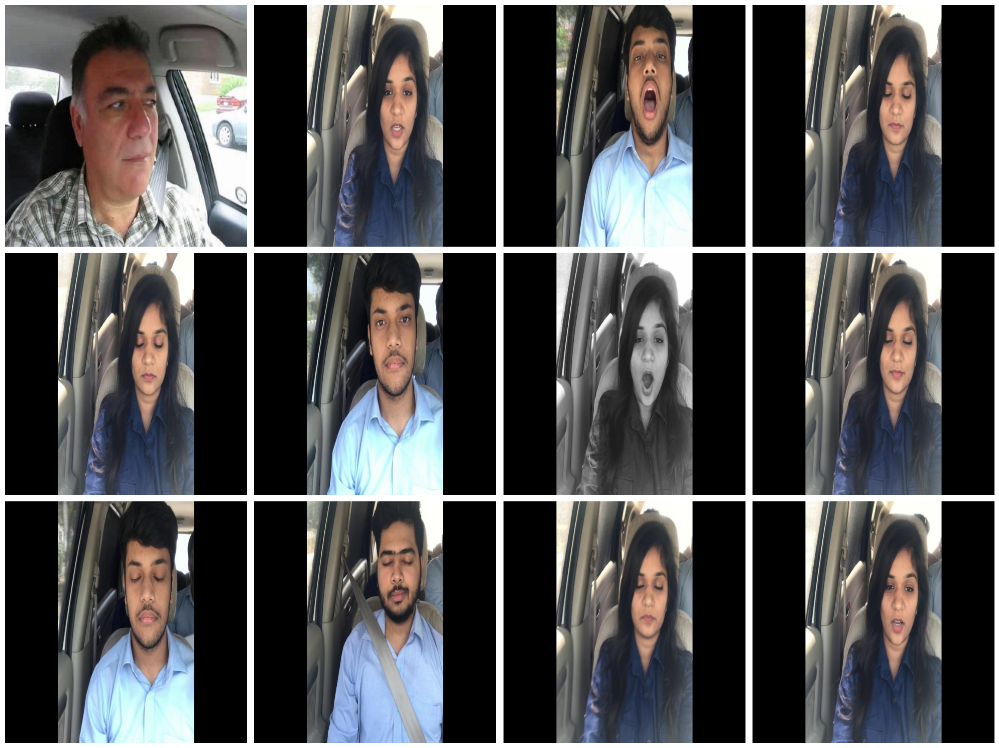

In [5]:
import glob
from PIL import Image
import matplotlib.pyplot as plt


image_paths = glob.glob('/content/drive-drowsiness-detection-1/train/images/*_jpg.rf.*.jpg')[24:36]


fig, axes = plt.subplots(3, 4, figsize=(20, 15))

for i, image_path in enumerate(image_paths):
    row = i // 4
    col = i % 4


    img = Image.open(image_path)

    axes[row, col].imshow(img)
    axes[row, col].axis('off')

plt.tight_layout()

plt.show()

In [6]:
import yaml


with open('/content/drive-drowsiness-detection-1/data.yaml', 'r') as file:
    data = yaml.safe_load(file)


data['test'] = '/content/drive-drowsiness-detection-1/../test/images'
data['train'] = '/content/drive-drowsiness-detection-1/train/images'
data['val'] = '/content/drive-drowsiness-detection-1/valid/images'


with open('/content/drive-drowsiness-detection-1/data.yaml', 'w') as file:
    yaml.dump(data, file)

In [7]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=50 imgsz=640 plots=True

100% 49.7M/49.7M [00:00<00:00, 253MB/s]
Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive-drowsiness-detection-1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, 

In [8]:
from IPython.display import display , Image
from IPython import display
display.clear_output()

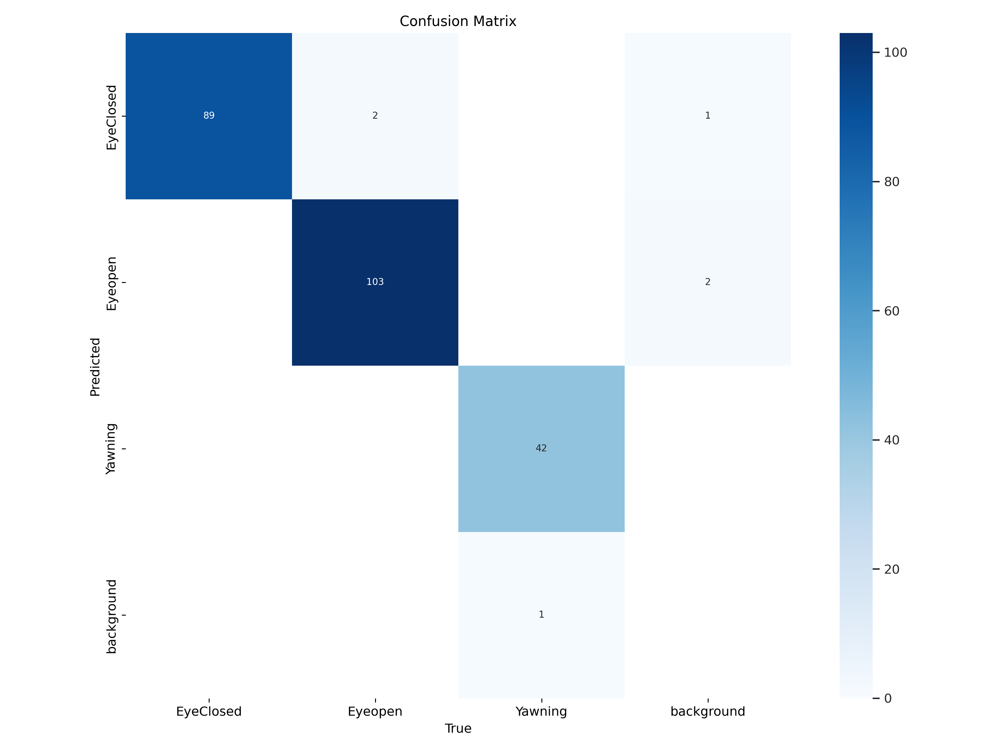

In [9]:
Image(filename = f'/content/runs/detect/train/confusion_matrix.png' , height = 600)

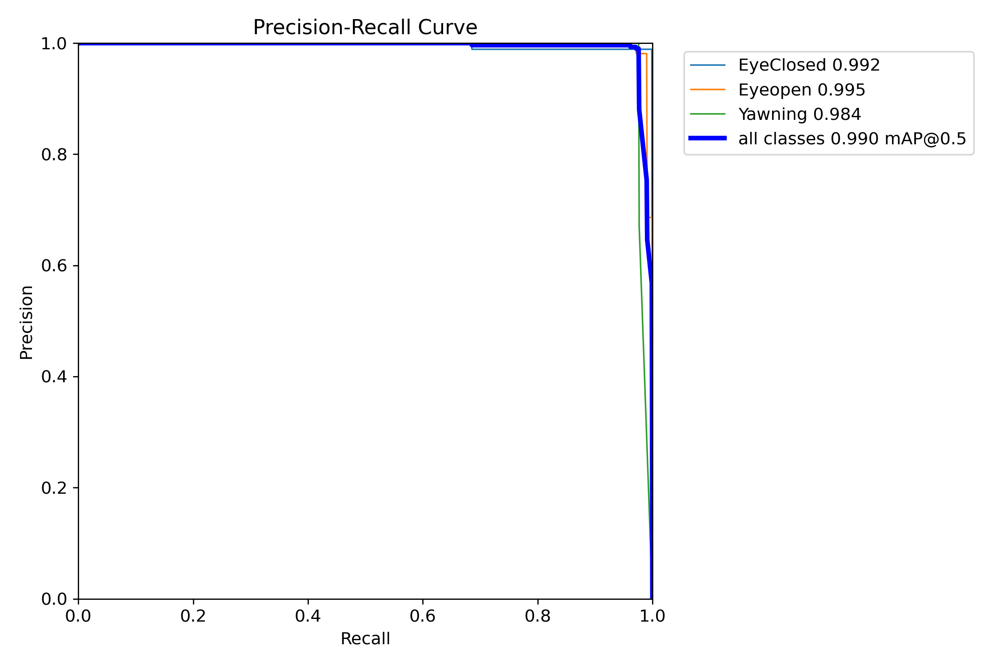

In [10]:
Image(filename=f'/content/runs/detect/train/PR_curve.png', width=600)

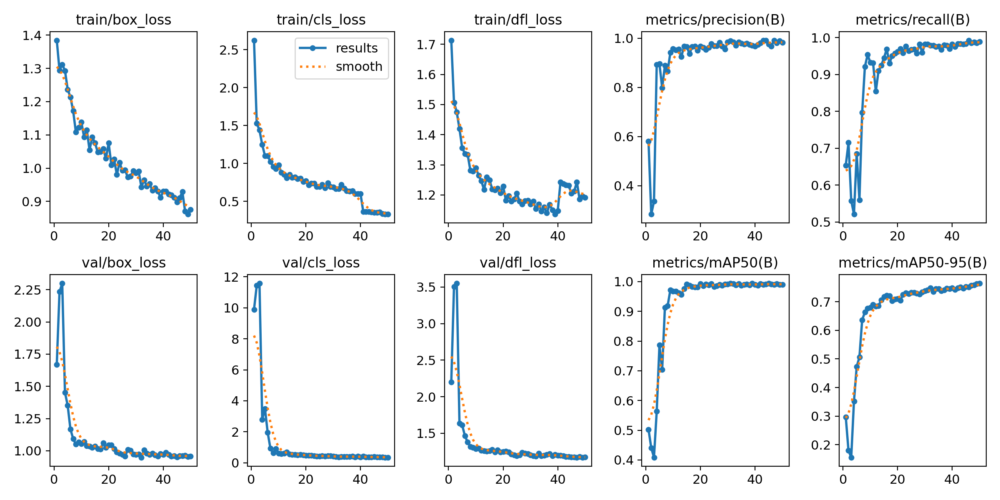

In [11]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [12]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/drive-drowsiness-detection-1/valid/labels.cache... 238 images, 1 backgrounds, 0 corrupt: 100% 238/238 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 15/15 [00:07<00:00,  1.92it/s]
                   all        238        237      0.983      0.989       0.99      0.765
             EyeClosed         89         89      0.976          1      0.992      0.788
               Eyeopen        105        105      0.981       0.99      0.995      0.761
               Yawning         43         43      0.992      0.977      0.984      0.745
Speed: 1.0ms preprocess, 22.2ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [13]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs

image 1/119 /content/drive-drowsiness-detection-1/test/images/104_jpg.rf.317ec1bb6ce15b65578f9294ded02449.jpg: 640x640 1 Eyeopen, 37.1ms
image 2/119 /content/drive-drowsiness-detection-1/test/images/1050_jpg.rf.7cf8d41abd519370999c7fbda0505308.jpg: 640x640 1 Eyeopen, 37.0ms
image 3/119 /content/drive-drowsiness-detection-1/test/images/1067_jpg.rf.1a46a9d28789082e7d9733ec071561b4.jpg: 640x640 1 Eyeopen, 37.1ms
image 4/119 /content/drive-drowsiness-detection-1/test/images/1087_jpg.rf.ae5b2fe4c474e525dd78a7cd61b5d468.jpg: 640x640 1 EyeClosed, 37.1ms
image 5/119 /content/drive-drowsiness-detection-1/test/images/1088_jpg.rf.3c85d08545b7d98be9f1a620256481a8.jpg: 640x640 1 EyeClosed, 27.8ms
image 6/119 /content/drive-drowsiness-detection-1/test/images/1095_jpg.rf.fe019ebfb7bdd9f25bdcb4c879c284ba.jpg: 640x640 1 EyeClosed, 27.7ms
i

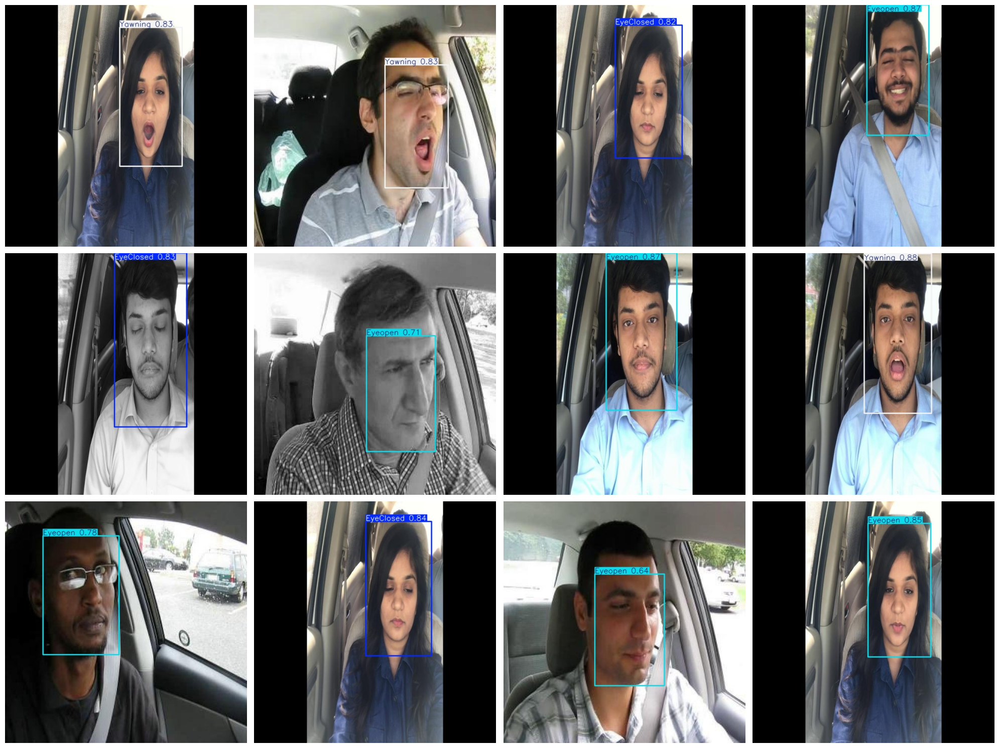

In [14]:
import glob
from PIL import Image
import matplotlib.pyplot as plt


image_paths = glob.glob('/content/runs/detect/predict/*.jpg')[-12:]


fig, axes = plt.subplots(3, 4, figsize=(20, 15))


for i, image_path in enumerate(image_paths):
    row = i // 4
    col = i % 4

    img = Image.open(image_path)

    axes[row, col].imshow(img)
    axes[row, col].axis('off')


plt.tight_layout()

# Show the plot
plt.show()

Model2 100epochs

In [15]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=100 imgsz=640 plots=True

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive-drowsiness-detection-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

In [16]:
from IPython.display import display , Image
from IPython import display
display.clear_output()

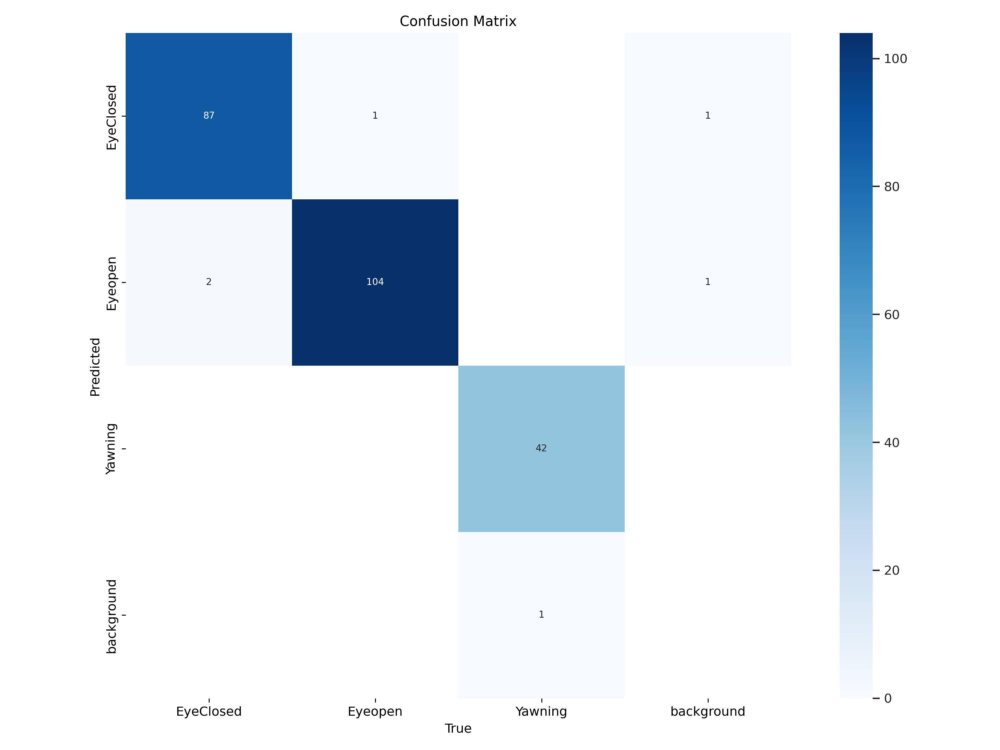

In [17]:
Image(filename = f'/content/runs/detect/train2/confusion_matrix.png' , height = 600)

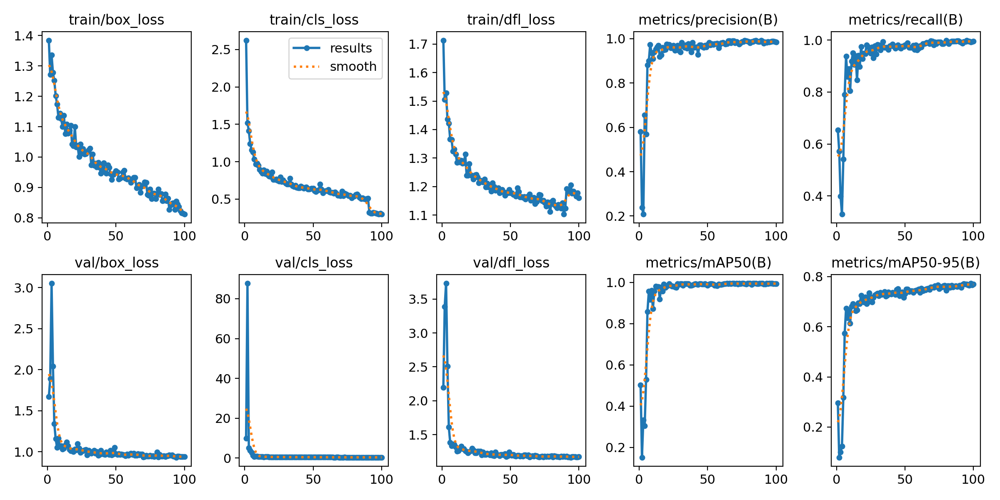

In [18]:
Image(filename=f'/content/runs/detect/train2/results.png', width=600)

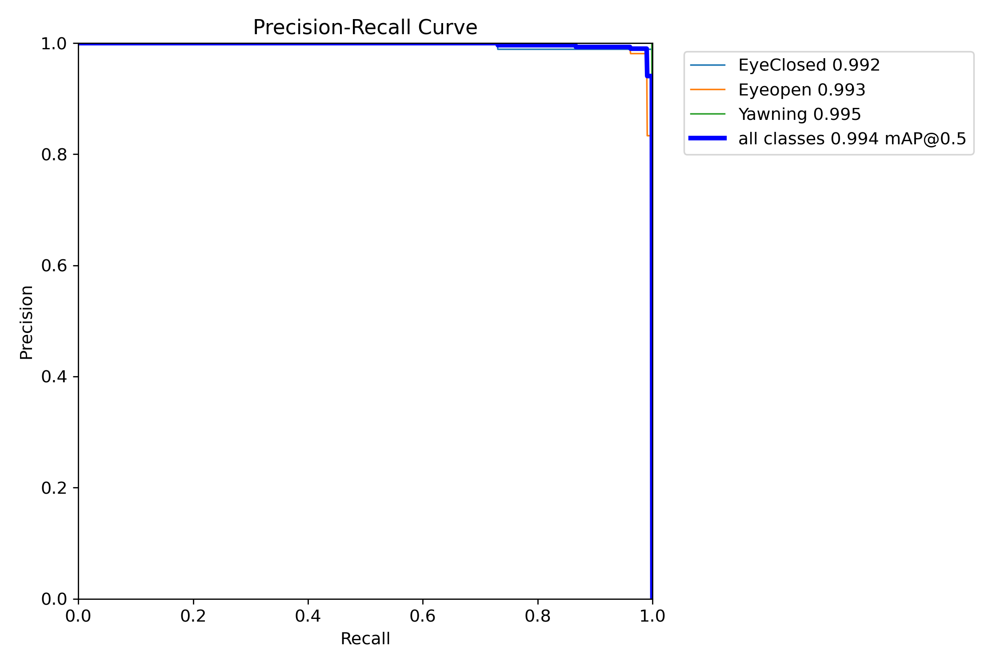

In [19]:
Image(filename=f'/content/runs/detect/train2/PR_curve.png', width=600)

In [20]:
!yolo task=detect mode=val model=/content/runs/detect/train2/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/drive-drowsiness-detection-1/valid/labels.cache... 238 images, 1 backgrounds, 0 corrupt: 100% 238/238 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 15/15 [00:07<00:00,  1.99it/s]
                   all        238        237      0.987      0.993      0.994       0.77
             EyeClosed         89         89      0.989      0.997      0.992       0.79
               Eyeopen        105        105      0.973       0.99      0.993      0.778
               Yawning         43         43          1      0.991      0.995      0.743
Speed: 1.1ms preprocess, 21.5ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/val2
💡 Learn more at https://docs.ultralytics.com/modes/val


In [21]:
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs

image 1/119 /content/drive-drowsiness-detection-1/test/images/104_jpg.rf.317ec1bb6ce15b65578f9294ded02449.jpg: 640x640 1 Eyeopen, 37.2ms
image 2/119 /content/drive-drowsiness-detection-1/test/images/1050_jpg.rf.7cf8d41abd519370999c7fbda0505308.jpg: 640x640 1 Eyeopen, 37.1ms
image 3/119 /content/drive-drowsiness-detection-1/test/images/1067_jpg.rf.1a46a9d28789082e7d9733ec071561b4.jpg: 640x640 1 Eyeopen, 37.1ms
image 4/119 /content/drive-drowsiness-detection-1/test/images/1087_jpg.rf.ae5b2fe4c474e525dd78a7cd61b5d468.jpg: 640x640 1 EyeClosed, 37.0ms
image 5/119 /content/drive-drowsiness-detection-1/test/images/1088_jpg.rf.3c85d08545b7d98be9f1a620256481a8.jpg: 640x640 1 EyeClosed, 28.2ms
image 6/119 /content/drive-drowsiness-detection-1/test/images/1095_jpg.rf.fe019ebfb7bdd9f25bdcb4c879c284ba.jpg: 640x640 1 EyeClosed, 28.2ms
i

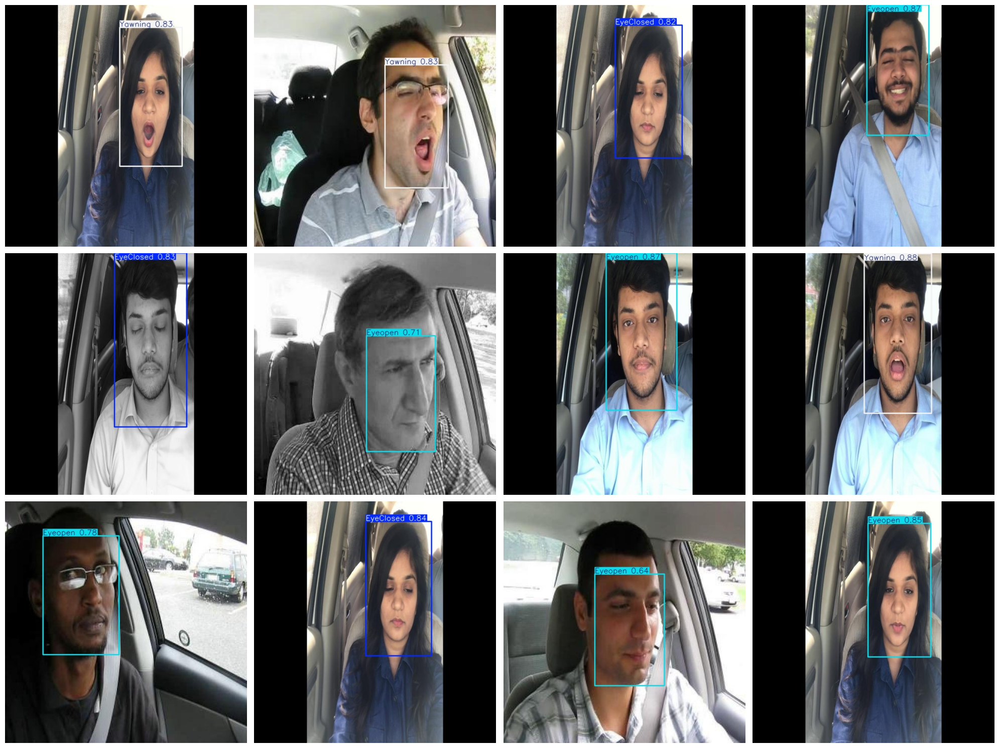

In [22]:
import glob
from PIL import Image
import matplotlib.pyplot as plt


image_paths = glob.glob('/content/runs/detect/predict/*.jpg')[-12:]


fig, axes = plt.subplots(3, 4, figsize=(20, 15))


for i, image_path in enumerate(image_paths):
    row = i // 4
    col = i % 4

    img = Image.open(image_path)

    axes[row, col].imshow(img)
    axes[row, col].axis('off')


plt.tight_layout()

# Show the plot
plt.show()

In [25]:
!zip -r runs.zip /content/runs/

  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/val2/ (stored 0%)
  adding: content/runs/detect/val2/val_batch2_pred.jpg (deflated 15%)
  adding: content/runs/detect/val2/val_batch1_labels.jpg (deflated 14%)
  adding: content/runs/detect/val2/R_curve.png (deflated 16%)
  adding: content/runs/detect/val2/val_batch0_labels.jpg (deflated 18%)
  adding: content/runs/detect/val2/F1_curve.png (deflated 15%)
  adding: content/runs/detect/val2/confusion_matrix.png (deflated 32%)
  adding: content/runs/detect/val2/P_curve.png (deflated 22%)
  adding: content/runs/detect/val2/val_batch1_pred.jpg (deflated 13%)
  adding: content/runs/detect/val2/val_batch0_pred.jpg (deflated 17%)
  adding: content/runs/detect/val2/confusion_matrix_normalized.png (deflated 29%)
  adding: content/runs/detect/val2/PR_curve.png (deflated 26%)
  adding: content/runs/detect/val2/val_batch2_labels.jpg (deflated 15%)
  adding: content/runs/detect/predict/ (stor

In [26]:
from google.colab import files
files.download('runs.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [27]:
!zip -r drive-drowsiness-detection-1.zip /content/drive-drowsiness-detection-1/

  adding: content/drive-drowsiness-detection-1/ (stored 0%)
  adding: content/drive-drowsiness-detection-1/data.yaml (deflated 53%)
  adding: content/drive-drowsiness-detection-1/test/ (stored 0%)
  adding: content/drive-drowsiness-detection-1/test/labels/ (stored 0%)
  adding: content/drive-drowsiness-detection-1/test/labels/2820_jpg.rf.ef953a691b126f8240627e9030b42e8a.txt (deflated 16%)
  adding: content/drive-drowsiness-detection-1/test/labels/109_jpg.rf.1633bca130fff3a754e636e084916027.txt (deflated 37%)
  adding: content/drive-drowsiness-detection-1/test/labels/343_jpg.rf.13c33dd2439fe35266a540e999d5bc01.txt (deflated 15%)
  adding: content/drive-drowsiness-detection-1/test/labels/795_jpg.rf.15044c7e017a1e79a260d3cee689b58f.txt (deflated 14%)
  adding: content/drive-drowsiness-detection-1/test/labels/932_jpg.rf.0c126262b0447bba07e0be9f6329ae2c.txt (deflated 20%)
  adding: content/drive-drowsiness-detection-1/test/labels/478_jpg.rf.ac2f440f693cdd544b1ee94d00a6af3b.txt (deflated 21%